In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import mrcfile
import torch

from tomoSegmentPipeline.utils.common import read_array, write_array
from tomoSegmentPipeline.utils import setup
from cryoS2Sdrop.dataloader import singleCET_dataset, singleCET_FourierDataset

import tomopy.sim.project as proj
from tomopy.recon.algorithm import recon
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

PARENT_PATH = setup.PARENT_PATH

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 80

def standardize(X):
    mean = X.mean()
    std = X.std()
    new_X = (X - mean) / std

    return new_X

def clip(X, low=0.005, high=0.995):
    # works with tensors =)
    return np.clip(X, np.quantile(X, low), np.quantile(X, high))

/home/ubuntu/Thesis/miniconda3/envs/jero/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
cet_path = os.path.join(PARENT_PATH, 'data/S2SDenoising/dummy_tomograms/tomo02_dummy.mrc')
gt_tomo_path = os.path.join(PARENT_PATH, "data/S2SDenoising/dummy_tomograms/tomo02_cryoCAREDummy.mrc")

# cet_path = os.path.join(PARENT_PATH,
#                         '/home/ubuntu/Thesis/data/S2SDenoising/dummy_tomograms/tomoPhantom_model14_noisyGaussPoiss.mrc')
# gt_tomo_path = os.path.join(PARENT_PATH,
#                         '/home/ubuntu/Thesis/data/S2SDenoising/dummy_tomograms/tomoPhantom_model14.mrc')

# cet_path = os.path.join(PARENT_PATH,
#                         'data/shrec2021/model_8/reconstruction.mrc')
# gt_tomo_path = os.path.join(PARENT_PATH,
#                         'data/shrec2021/model_8/grandmodel.mrc')



my_dataset = singleCET_FourierDataset(cet_path, 96, 0.3, gt_tomo_path=gt_tomo_path, n_bernoulli_samples=2)
tomo_data = my_dataset.data
tomo_shape = np.array(tomo_data.shape)
tomo_shape

Creating Fourier samples...
Done!


array([232, 464, 464])

In [3]:
my_dataset.fourier_samples.shape

torch.Size([32, 1, 232, 464, 464])

In [4]:
my_dataset.dataF.shape

torch.Size([232, 464, 233])

In [5]:
# fft_data = my_dataset.dataF.numpy()
fft_data = np.fft.fftshift(np.fft.fftn(tomo_data))
# fft_data = fft_data[:, :, 0:233]
logPower_Fdata = np.log(np.abs(fft_data)**2)
logPower_Fdata = standardize(clip(logPower_Fdata))

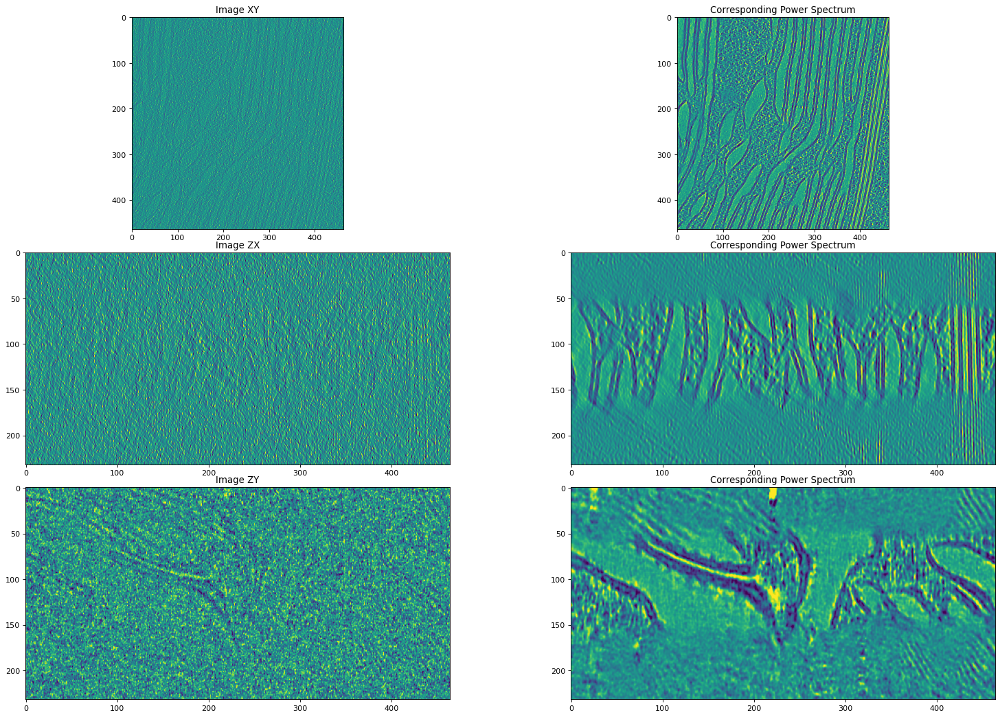

In [6]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [1, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_data[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(my_dataset.gt_data[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_data[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(my_dataset.gt_data[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_data[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(my_dataset.gt_data[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

In [7]:
logPower_Fdata.shape

(232, 464, 464)

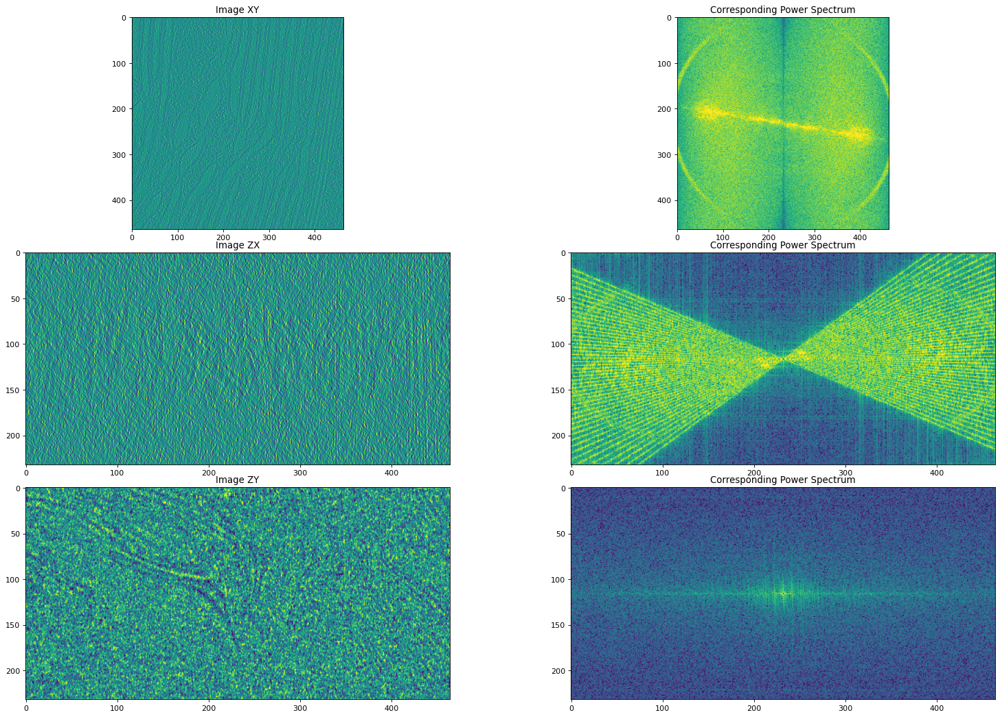

In [8]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [1, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_data[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_Fdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_data[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_Fdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_data[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_Fdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

(array([22275747.,  7634193.,  7076850.,  4894856.,  3058470.,  1976812.,
         1283924.,   789342.,   460064.,   498414.]),
 array([0.09447224, 0.80936175, 1.52425127, 2.23914078, 2.95403029,
        3.66891981, 4.38380932, 5.09869883, 5.81358835, 6.52847786,
        7.24336737]),
 <BarContainer object of 10 artists>)

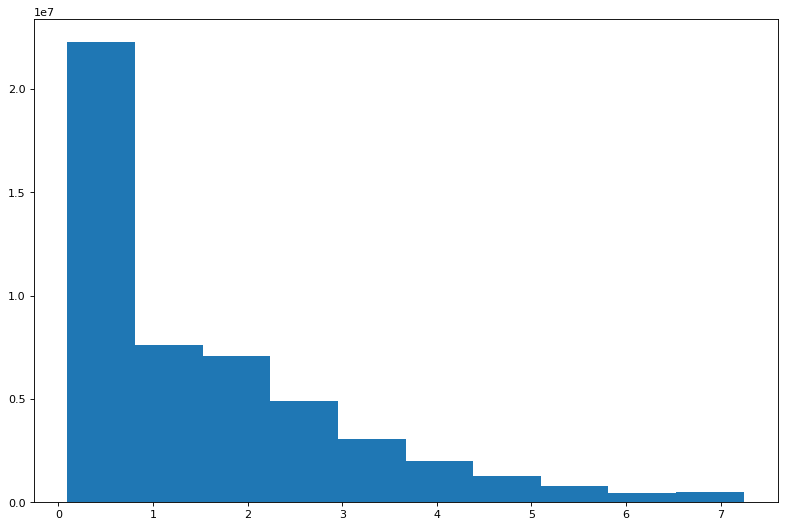

In [9]:
power_Fdata = np.exp(logPower_Fdata)
# power_Fdata = standardize(clip(power_Fdata))
plt.hist(power_Fdata.flatten())

# High power mask

In [25]:
# highP_mask = my_dataset.create_bernoulliMask()[0].numpy()*(power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)
highP_mask = (power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)

logPower_filtered = highP_mask*logPower_Fdata

fft_filtered = highP_mask*fft_data
tomo_filtered = np.fft.irfftn(fft_filtered)
# tomo_filtered = np.real(tomo_filtered)

(array([ 441631., 1034472., 2721388., 4138180., 2970947., 2400922.,
        3631055., 3916564., 2619265., 1207560.]),
 array([-2.3588214 , -1.924957  , -1.4910928 , -1.0572284 , -0.6233641 ,
        -0.1894998 ,  0.24436453,  0.67822886,  1.1120932 ,  1.5459574 ,
         1.9798218 ], dtype=float32),
 <BarContainer object of 10 artists>)

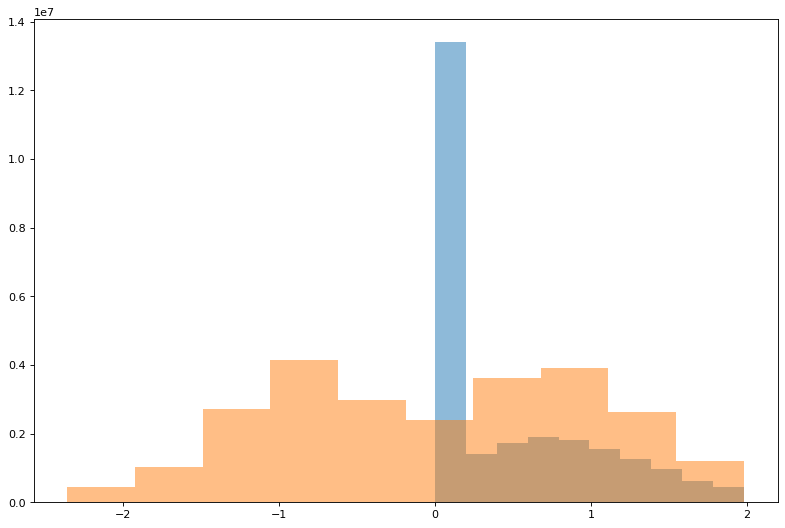

In [26]:
plt.hist(logPower_filtered.flatten(), alpha=0.5)
plt.hist(logPower_Fdata.flatten(), alpha=0.5)

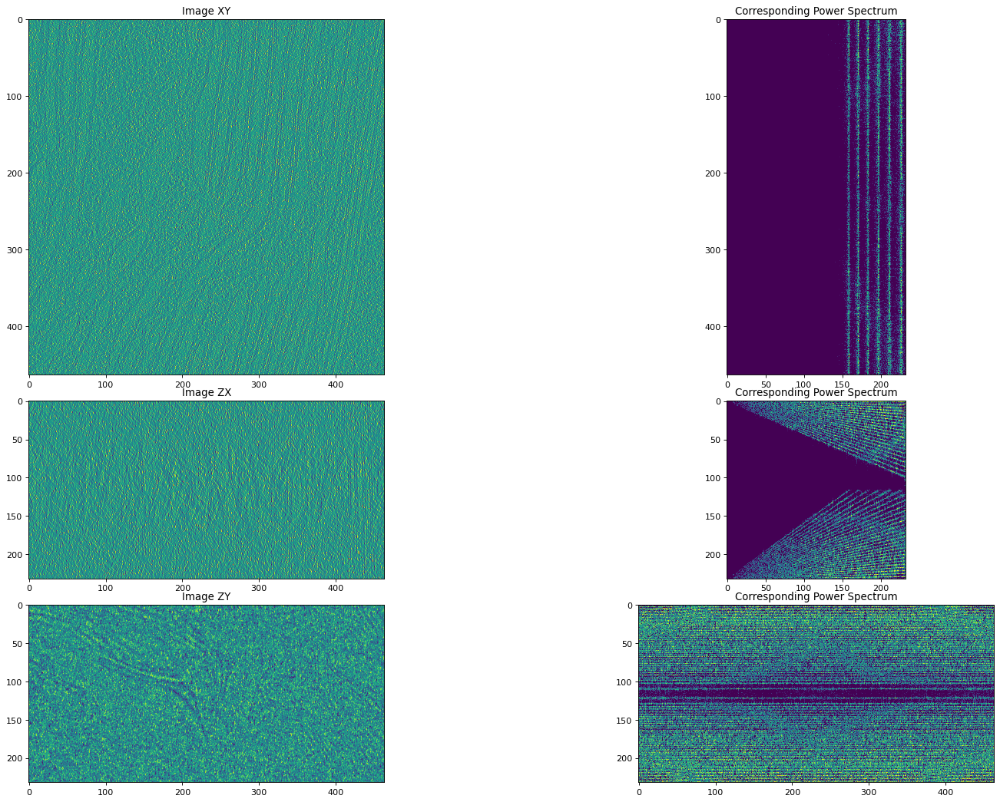

In [27]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_filtered[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_filtered[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_filtered[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

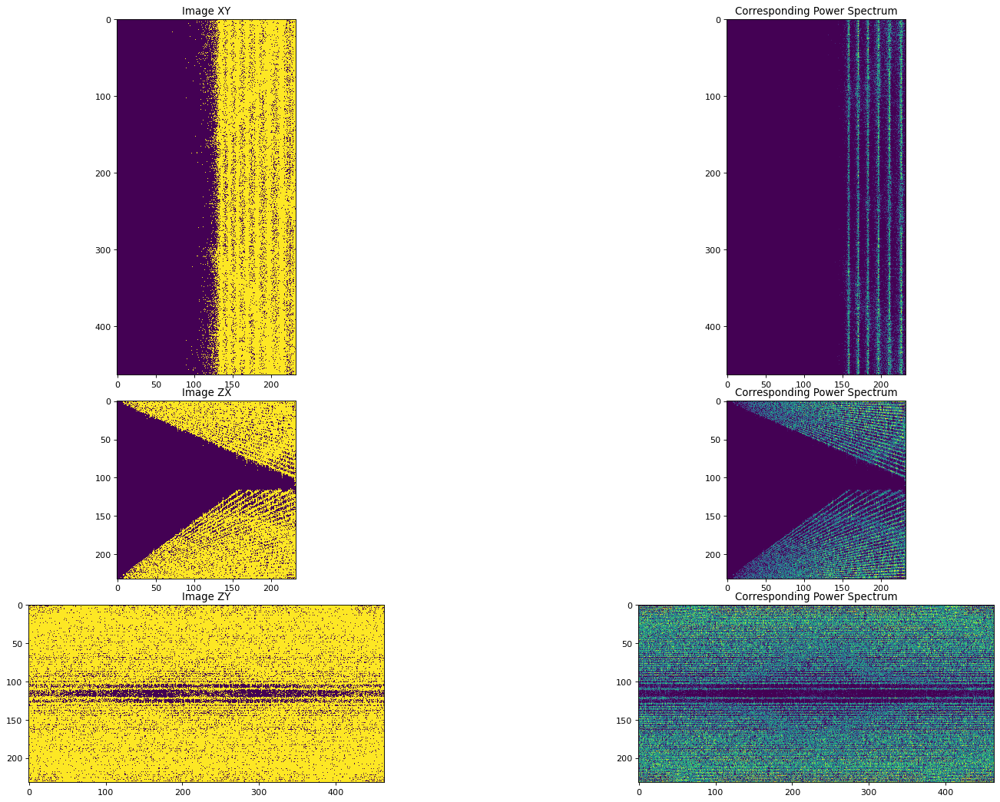

In [33]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(highP_mask[tomo_shape[0]//4])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(highP_mask[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(highP_mask[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

# Weighted Bernoulli mask

In [11]:
############### Gaussian ##################

z, y, x = np.mgrid[0:tomo_shape[0]:1, 0:tomo_shape[1]:1, 0:tomo_shape[2]:1]

zyx = np.column_stack([z.flat, y.flat, x.flat])
zyx.shape

mu = tomo_shape//2
sigma = tomo_shape//4
covariance = np.diag(sigma**2)

rv = multivariate_normal(mu, covariance)
pdf = rv.pdf(zyx)
pdf = pdf.reshape(tomo_shape)

draw_probs = 0.5*pdf/pdf.max()
highP_mask = 0.3*(power_Fdata>np.quantile(power_Fdata, 0.5)).astype(int)

bernoulli_tensor = torch.bernoulli(torch.tensor(draw_probs+highP_mask+0.05)).numpy()

bernoulli_tensor.sum()/tomo_shape.prod()

0.30697861196389764

In [64]:
############### Quantile ##################

z, y, x = np.mgrid[0:tomo_shape[0]:1, 0:tomo_shape[1]:1, 0:tomo_shape[2]:1]

zyx = np.column_stack([z.flat, y.flat, x.flat])
zyx.shape

mu = tomo_shape//2
sigma = tomo_shape//4
covariance = np.diag(sigma**2)

rv = multivariate_normal(mu, covariance)
pdf = rv.pdf(zyx)
pdf = pdf.reshape(tomo_shape)

v1 = rv.pdf([mu+0.2*sigma])
q1 = 0.4*(pdf>v1).astype(int)

v2 = rv.pdf([mu+0.5*sigma])
q2 = 0.3*(pdf>v2)*(pdf<=v1)

v3 = rv.pdf([mu+0.8*sigma])
q3 = 0.2*(pdf>v3)*(pdf<=v2)

q4 = 0.1*(pdf<=v3)

# v4 = rv.pdf([mu+0.9*sigma])
# q4 = 0.15*(pdf>v4)*(pdf<=v3)

# q5 = 0.1*(pdf<=v4)

draw_probs = q1+q2+q3+q4
highP_mask = 0.3*(power_Fdata>np.quantile(power_Fdata, 0.2)).astype(int)

_bt = torch.tensor(draw_probs+highP_mask)
bernoulli_tensor = torch.bernoulli(_bt).numpy()

bernoulli_tensor.sum()/tomo_shape.prod()

0.3619891836163332

In [58]:
# bernoulli_tensor = torch.bernoulli(0.3*torch.ones(tuple(tomo_shape))).numpy()

# bernoulli_tensor.sum()/tomo_shape.prod()

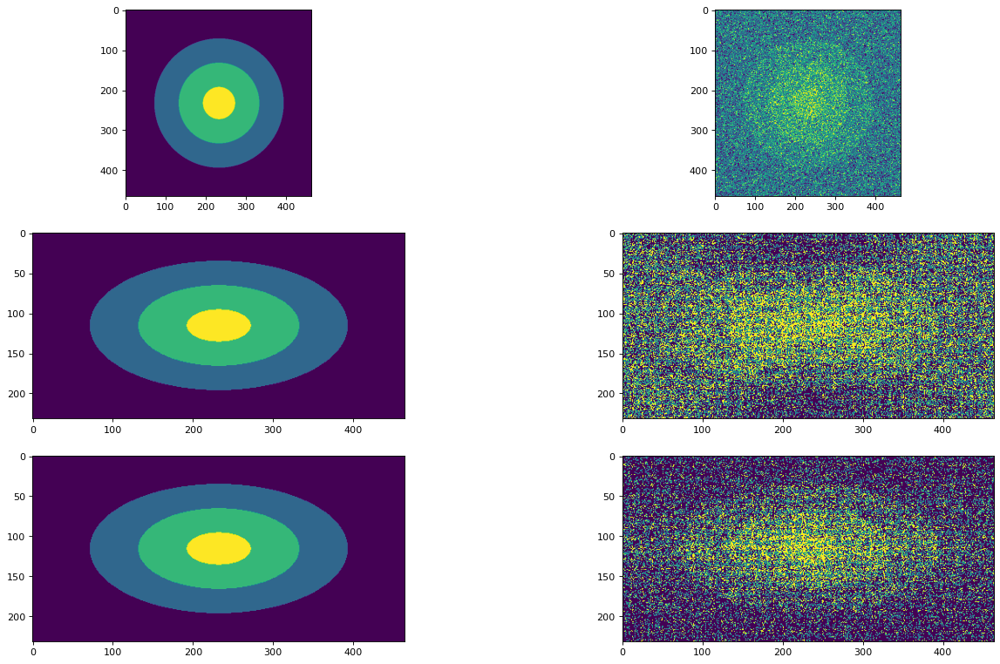

In [65]:
fig, (ax0, ax1, ax2) = plt.subplots(3, 2, figsize=(20, 12))
ax0[0].imshow(draw_probs[tomo_shape[0]//2])
ax0[1].imshow(bernoulli_tensor[tomo_shape[0]//2])

ax1[0].imshow(draw_probs[:, tomo_shape[1]//2, :])
ax1[1].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])

ax2[0].imshow(draw_probs[:, :, tomo_shape[2]//2])
ax2[1].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])

In [66]:
logPower_filtered = bernoulli_tensor*logPower_Fdata

fft_filtered = bernoulli_tensor*fft_data
tomo_filtered = np.fft.ifftn(np.fft.ifftshift(fft_filtered))
tomo_filtered = np.real(tomo_filtered)

(array([ 879424., 2058830., 5416343., 8236713., 5916223., 4786203.,
        7239670., 7799550., 5211628., 2404088.]),
 array([-2.35944923, -1.92549568, -1.49154214, -1.0575886 , -0.62363505,
        -0.18968151,  0.24427203,  0.67822558,  1.11217912,  1.54613266,
         1.98008621]),
 <BarContainer object of 10 artists>)

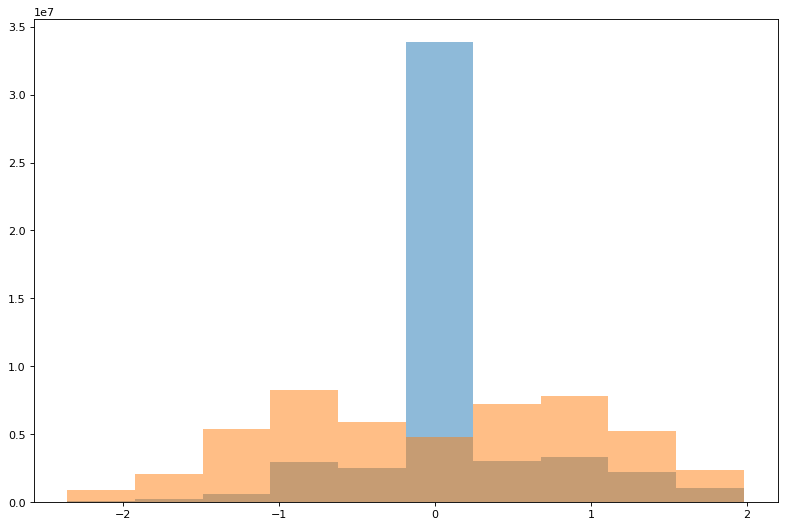

In [67]:
plt.hist(logPower_filtered.flatten(), alpha=0.5)
plt.hist(logPower_Fdata.flatten(), alpha=0.5)

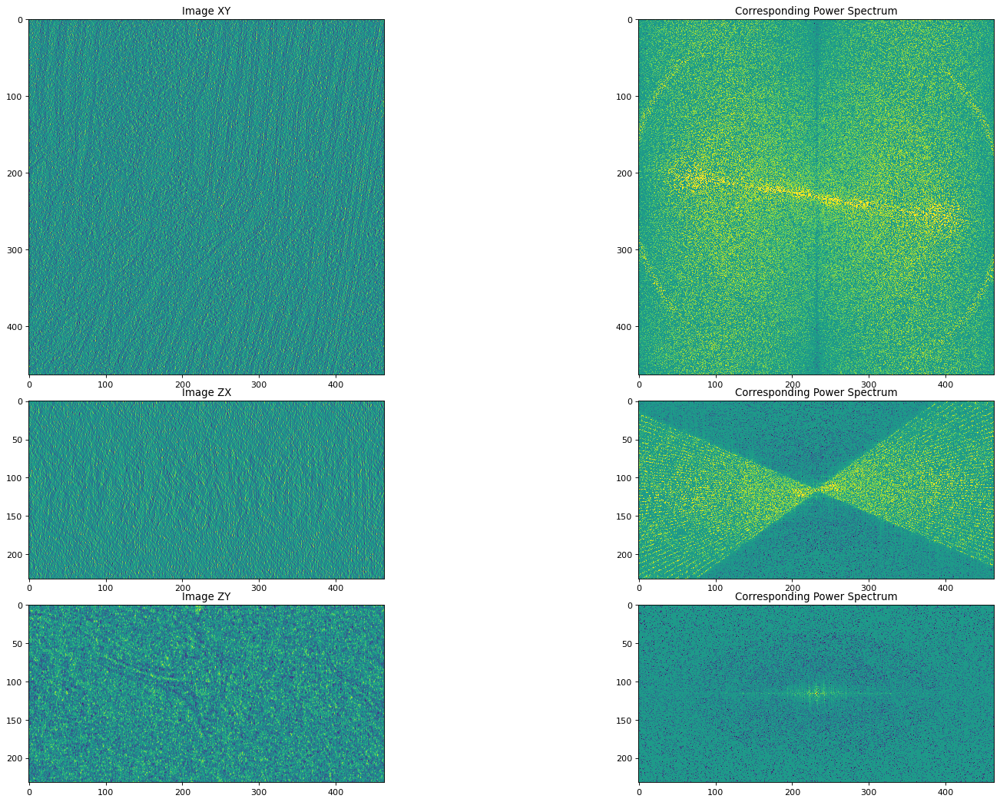

In [68]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_filtered[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_filtered[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_filtered[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

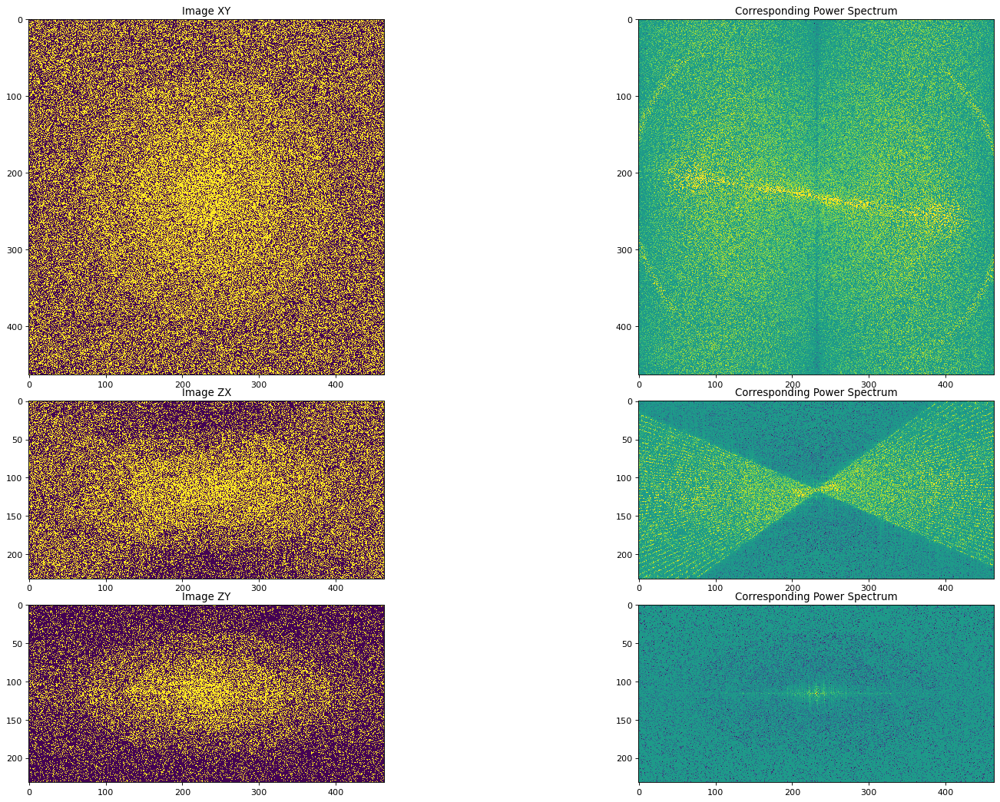

In [69]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(bernoulli_tensor[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_filtered[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(bernoulli_tensor[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_filtered[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(bernoulli_tensor[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_filtered[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')

plt.show()

# Frequency masks

In [7]:
def make_shell(inner_radius, delta_r, tomo_shape):
    """
    Creates a (3D) shell with given inner_radius and delta_r width centered at the middle of the array.
    
    """
    outer_radius = inner_radius + delta_r

    length = min(tomo_shape)
    mask_shape = len(tomo_shape) * [length]
    _shell_mask = np.zeros(mask_shape)

    # only do positive quadrant first
    for z in range(0, outer_radius + 1):
        for y in range(0, outer_radius + 1):
            for x in range(0, outer_radius + 1):
            

                r = np.linalg.norm([z, y, x])

                if r >= inner_radius and r < outer_radius:
                    zidx = z + length // 2
                    yidx = y + length // 2
                    xidx = x + length // 2

                    _shell_mask[zidx, yidx, xidx] = 1

    # first get shell for x>0
    aux = (
        np.rot90(_shell_mask, axes=(0, 1))
        + np.rot90(_shell_mask, 2, axes=(0, 1))
        + np.rot90(_shell_mask, 3, axes=(0, 1))
        + np.rot90(_shell_mask, 2, axes=(0, 2))
        + np.rot90(_shell_mask, 3, axes=(0, 2))
        + np.rot90(_shell_mask, 2, axes=(1, 2))
    )
    aux2 = _shell_mask + aux

    # finally, fill the actual shape of the tomogram with the mask
    shell_mask = np.zeros(tomo_shape)
    shell_mask[
        (tomo_shape[0] - length) // 2 : (tomo_shape[0] + length) // 2,
        (tomo_shape[1] - length) // 2 : (tomo_shape[1] + length) // 2,
        (tomo_shape[2] - length) // 2 : (tomo_shape[2] + length) // 2
    ] = aux2

    return shell_mask

In [8]:
inner = 0
outer = 40
shell_mask = make_shell(inner, outer-inner, tomo_shape)
shell_mask.shape

(256, 256, 256)

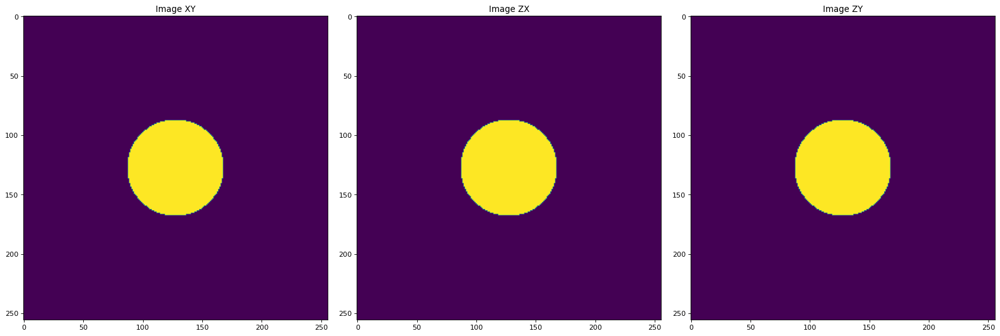

In [10]:
fig, ax = plt.subplots(1, 3, figsize=(20, 13))  
plt.tight_layout()

ax[0].imshow(shell_mask[tomo_shape[0]//2])
ax[0].set_title('Image XY')

ax[1].imshow(shell_mask[:, tomo_shape[0]//2, :])
ax[1].set_title('Image ZX')

ax[2].imshow(shell_mask[:, :, tomo_shape[0]//2])
ax[2].set_title('Image ZY')


plt.show()

In [12]:
fft_loFreq = shell_mask*fft_data
tomo_loFreqFilt = np.fft.ifftn(np.fft.ifftshift(fft_loFreq))
tomo_loFreqFilt = np.real(tomo_loFreqFilt)

logPower_loFreqFdata = np.log(np.abs(fft_loFreq)**2)
# logPower_loFreqFdata = standardize(clip(logPower_loFreqFdata))

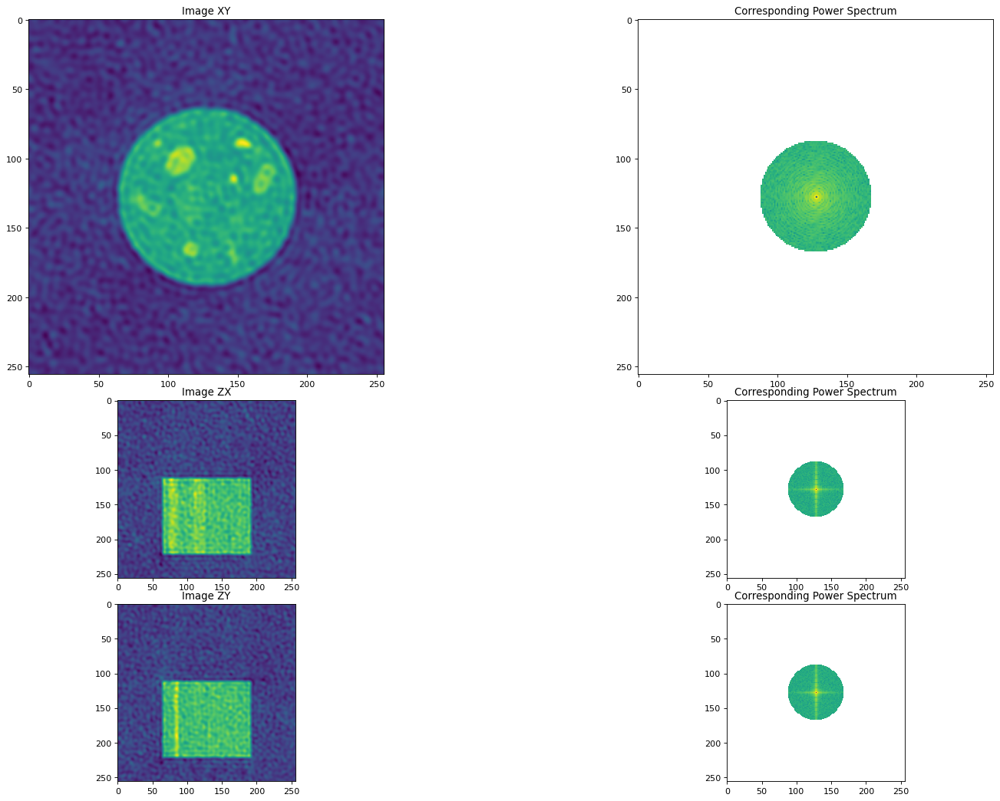

In [13]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_loFreqFilt[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_loFreqFdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_loFreqFilt[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_loFreqFdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_loFreqFilt[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_loFreqFdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()

# Combine masks

In [15]:
fft_loFreq = highP_mask*shell_mask*fft_data
tomo_loFreqFilt = np.fft.ifftn(np.fft.ifftshift(fft_loFreq))
tomo_loFreqFilt = np.real(tomo_loFreqFilt)

logPower_loFreqFdata = np.log(np.abs(fft_loFreq)**2)
# logPower_loFreqFdata = standardize(clip(logPower_loFreqFdata))

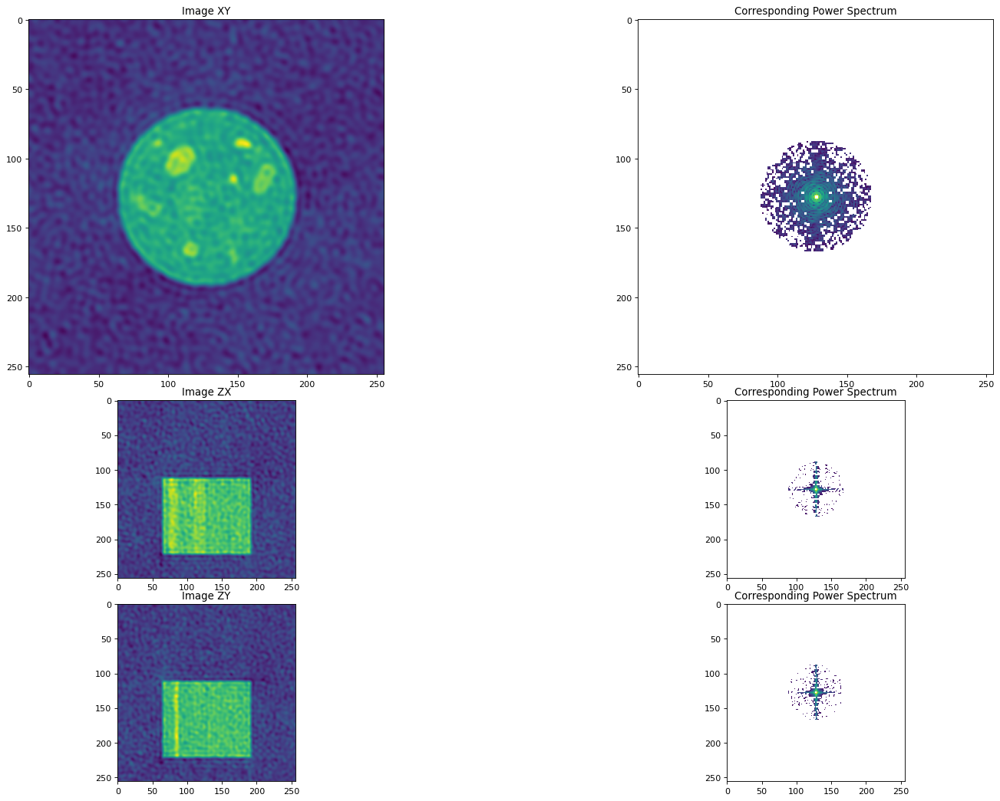

In [16]:
fig, ax = plt.subplots(3, 2, figsize=(20, 13), gridspec_kw={'height_ratios': [2, 1, 1]})  
plt.tight_layout()

ax[0][0].imshow(tomo_loFreqFilt[tomo_shape[0]//2])
ax[0][0].set_title('Image XY')

ax[0][1].imshow(logPower_loFreqFdata[tomo_shape[0]//2])
ax[0][1].set_title('Corresponding Power Spectrum')

ax[1][0].imshow(tomo_loFreqFilt[:, tomo_shape[1]//2, :])
ax[1][0].set_title('Image ZX')

ax[1][1].imshow(logPower_loFreqFdata[:, tomo_shape[1]//2, :])
ax[1][1].set_title('Corresponding Power Spectrum')

ax[2][0].imshow(tomo_loFreqFilt[:, :, tomo_shape[2]//2])
ax[2][0].set_title('Image ZY')

ax[2][1].imshow(logPower_loFreqFdata[:, :, tomo_shape[2]//2])
ax[2][1].set_title('Corresponding Power Spectrum')


plt.show()